In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import keras
import tensorflow as tf
from os import path
from PIL import Image
from keras.layers import Dense, Dropout, Embedding, Flatten
from wordcloud import WordCloud

In [3]:
maxlen = 10000
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.imdb.load_data(num_words = maxlen)

17464789/17464789 [==============================] - 1s 0us/step


In [4]:
print(x_train.shape, y_train.shape)
print(x_test.shape, y_test.shape)

(25000,) (25000,)
(25000,) (25000,)


In [5]:
x_train = tf.keras.utils.pad_sequences(x_train, maxlen=maxlen)
x_test = tf.keras.utils.pad_sequences(x_test, maxlen=maxlen)

In [6]:
word_index = tf.keras.datasets.imdb.get_word_index()
reverse_word_index = dict([(value+3, key) for (key, value) in word_index.items()])
reverse_word_index[0] = "<PAD>"
reverse_word_index[1] = "<ST>"
reverse_word_index[2] = "<OOV>"

1641221/1641221 [==============================] - 0s 0us/step


In [7]:
def decode(X):
  return " ".join(reverse_word_index[i] for i in X if i!=0 and i!=1 and i!=2 and reverse_word_index[i]!="br")

In [8]:
text_pos = ""
text_neg = ""
for i in range(len(x_train)):
  if (y_train[i]==0):
    text_neg += decode(x_train[i])+" "
  if (y_test[i]==0):
    text_pos += decode(x_train[i])+" "

In [9]:
text_neg

"big hair big boobs bad music and a giant safety pin these are the words to best describe this terrible movie i love cheesy horror movies and i've seen hundreds but this had got to be on of the worst ever made the plot is paper thin and ridiculous the acting is an abomination the script is completely laughable the best is the end showdown with the cop and how he worked out who the killer is it's just so damn terribly written the clothes are sickening and funny in equal the hair is big lots of boobs men wear those cut shirts that show off their sickening that men actually wore them and the music is just trash that plays over and over again in almost every scene there is trashy music boobs and taking away bodies and the gym still doesn't close for all joking aside this is a truly bad film whose only charm is to look back on the disaster that was the 80's and have a good old laugh at how bad everything was back then this has to be one of the worst films of the 1990s when my friends i were

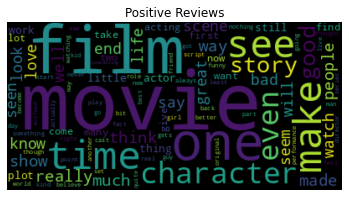

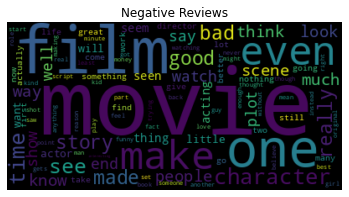

In [10]:
wordcloud = WordCloud(max_words=100).generate(text_pos)
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.title("Positive Reviews")
plt.axis("off")
plt.show()
wordcloud = WordCloud(max_words=100).generate(text_neg)
plt.figure()
plt.imshow(wordcloud, interpolation="bilinear")
plt.title("Negative Reviews")
plt.axis("off")
plt.show()

In [11]:
decode(x_test[0])

"please give this one a miss and the rest of the cast rendered terrible performances the show is flat flat flat i don't know how michael madison could have allowed this one on his plate he almost seemed to know this wasn't going to work out and his performance was quite so all you madison fans give this a miss"

In [12]:
!pip install wordcloud

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [13]:
inputs = keras.Input(shape=(None,), dtype="int32")
x = keras.layers.Embedding(maxlen, 128)(inputs)
x = keras.layers.Bidirectional(keras.layers.LSTM(64, return_sequences=True))(x)
x = keras.layers.Bidirectional(keras.layers.LSTM(64))(x)
outputs = keras.layers.Dense(1, activation="sigmoid")(x)
model = keras.Model(inputs, outputs)
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding (Embedding)       (None, None, 128)         1280000   
                                                                 
 bidirectional (Bidirectiona  (None, None, 128)        98816     
 l)                                                              
                                                                 
 bidirectional_1 (Bidirectio  (None, 128)              98816     
 nal)                                                            
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 1,477,761
Trainable params: 1,477,761
Non-train

In [14]:
dir(model.compile)

['__call__',
 '__class__',
 '__delattr__',
 '__dir__',
 '__doc__',
 '__eq__',
 '__format__',
 '__func__',
 '__ge__',
 '__get__',
 '__getattribute__',
 '__gt__',
 '__hash__',
 '__init__',
 '__init_subclass__',
 '__le__',
 '__lt__',
 '__ne__',
 '__new__',
 '__original_wrapped__',
 '__reduce__',
 '__reduce_ex__',
 '__repr__',
 '__self__',
 '__setattr__',
 '__sizeof__',
 '__str__',
 '__subclasshook__',
 '__wrapped__',
 '_tf_decorator']

In [15]:
model.compile("adam", "binary_crossentropy", metrics=["accuracy"])
model.fit(x_train, y_train, batch_size=64, epochs=5, validation_data=(x_test, y_test))

Epoch 1/5
391/391 [==============================] - 648s 2s/step - loss: 0.4499 - accuracy: 0.7876 - val_loss: 0.3139 - val_accuracy: 0.8708
Epoch 2/5
391/391 [==============================] - 648s 2s/step - loss: 0.2398 - accuracy: 0.9082 - val_loss: 0.3087 - val_accuracy: 0.8735
Epoch 3/5
391/391 [==============================] - 618s 2s/step - loss: 0.3100 - accuracy: 0.8712 - val_loss: 0.3539 - val_accuracy: 0.8472
Epoch 4/5
391/391 [==============================] - 640s 2s/step - loss: 0.2030 - accuracy: 0.9207 - val_loss: 0.3208 - val_accuracy: 0.8665
Epoch 5/5
391/391 [==============================] - 636s 2s/step - loss: 0.1780 - accuracy: 0.9332 - val_loss: 0.3594 - val_accuracy: 0.8646


In [16]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None)]            0         
                                                                 
 embedding (Embedding)       (None, None, 128)         1280000   
                                                                 
 bidirectional (Bidirectiona  (None, None, 128)        98816     
 l)                                                              
                                                                 
 bidirectional_1 (Bidirectio  (None, 128)              98816     
 nal)                                                            
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 1,477,761
Trainable params: 1,477,761
Non-train